# Prepare data for the model

Articles:  
1 - "Analysis of vehicle-bicycle interactions at unsignalized crossings: A probabilistic approach and application"  
2 - "When do drivers yield to cyclists at unsignalized roundabouts? Empirical evidence and behavioral analysis"


Based on literature what features should be taken into account: 
* <b>car speed </b> [1]
* <b>bicycle distance from the conflict zone </b> [1] [2]
* <b>arrival time difference at the boundary of each interaction zone </b> [2]


# In this notebook:
* Create features: 
    - car speed (at the IZ?)
    - bicycle distance from the conflict zone
    - arrival time difference at the boundary of each interaction zone
    
* Label data

In [1]:
import matplotlib.patches as mpatches
from sklearn import preprocessing 
from matplotlib.colors import from_levels_and_colors
from matplotlib import animation
from mat4py import loadmat
import itertools
import math

import numpy as np
import matplotlib.pyplot as plt
import sklearn as sklearn
import tensorflow as tf
import csv
import io
import sys
import pandas as pd

from datetime import datetime
from scipy.spatial import distance
from itertools import accumulate

print('-- Sys version --', sys.version)

# My custom imports
import import_ipynb
import helper_functions


-- Sys version -- 3.8.0 (v3.8.0:fa919fdf25, Oct 14 2019, 10:23:27) 
[Clang 6.0 (clang-600.0.57)]
importing Jupyter notebook from helper_functions.ipynb


### Constants

In [2]:
INTERACTIONS_FILE_NAME = 'interactions.csv'

INTERACTION_ZONE_1_LENGTH = 10

### Read interactions from the interactions.csv file

In [3]:
def convertStringToFloatArray(coordString):
    list = csv.DictReader(io.StringIO(coordString))
    # returns: ['[[26.6613331938]', ' [25.7778384119]', ... 
    
    coordsArray = []
    for index, string in enumerate(list.fieldnames):
        
        # Remove spaces from before and after the string
        # Also remove the "[" from the beginning and "]" from the end
        adjustedString = string.strip()[1:-1]
        
        if (index == 0):
            # Firsst string contains 2 of these "[[" and initial "["  has already been removd above
            adjustedString = adjustedString[1:]
            
        if (index == len(list.fieldnames)-1):
            # Last string contains 2 of these "]]" and initial "]"  has already been removd above
            adjustedString = adjustedString[:-1]
             
        coordsArray.append(adjustedString)
        
    
    # Let's convert to np.array of floats
    np_coordsArray = np.asarray(coordsArray, dtype=np.float64).tolist() 
    
    #print(' ---- np_coordsArray ----- ', np_coordsArray)
    return np_coordsArray


In [4]:
def restructureData(column_names, data):
    restructured_data = {}
    
    for insteraction_id in data.get('InteractionID'):
        restructured_data[insteraction_id] = []
    
    for i in range(len(data)):    
        restructured_instance = {}
        insteraction_id = data.get('InteractionID')[i]

        #print('column_names!!', column_names)
        for name in column_names:
            restructured_instance[name] = data.get(name)[i]
        
        restructured_data[insteraction_id].append(restructured_instance)

        
    print('Number of interactions: ', len(restructured_data))  
    print('First instance:', restructured_data[0])
    
    return restructured_data
    

def readFromCsvFile():
    
    df = pd.read_csv(INTERACTIONS_FILE_NAME, sep=',', converters={'Sec': convertStringToFloatArray, 'Xcoord': convertStringToFloatArray, 
                                                                 'Ycoord': convertStringToFloatArray, 'DateTime': convertStringToFloatArray,
                                                                 'Speed': convertStringToFloatArray})
    column_names = list(df.head())

    restructured_data = restructureData(column_names, df)
    
    #print(restructured_data[0])
    return restructured_data


In [5]:
restructured_data = readFromCsvFile()

Number of interactions:  520
First instance: [{'InteractionID': 0, 'CarID': 296, 'ID': 296, 'DateTime': [736942.6628986342, 736942.6629015394, 736942.6629043982, 736942.6629072222, 736942.6629101273, 736942.6629129514, 736942.6629158565, 736942.6629186689, 736942.6629215741, 736942.6629244097, 736942.6629272685, 736942.6629301967, 736942.6629329977, 736942.662935868, 736942.6629387268, 736942.6629415972, 736942.6629444908, 736942.6629473264, 736942.6629501968, 736942.6629530556, 736942.6629559259, 736942.6629587847, 736942.6629616551, 736942.6629645717, 736942.6629673959, 736942.6630084838, 736942.6630113426, 736942.6630142014, 736942.6630170601, 736942.6630199306, 736942.6630227894, 736942.6630256597, 736942.6630285301, 736942.6630314004, 736942.6630342477, 736942.663037118, 736942.663038831, 736942.6630487615, 736942.6630516088, 736942.6630909606, 736942.6630938194, 736942.6630966899, 736942.6630972569], 'Sec': [1504540474.442, 1504540474.693, 1504540474.94, 1504540475.184, 150454047

## Example instance features

In [6]:
def getFeatures(instance):
    id = instance['ID']
    t = instance['DateTime']
    ts = np.ravel(instance['Sec']) # Array of timestamps?? Example: 1504545880.957 = Monday, September 4, 2017 5:24:40.957 PM
    x = np.array(instance['Xcoord'])
    y = np.ravel(instance['Ycoord'])
    v = np.ravel(instance['Speed']) # Speed at every coordinate (x, y) (km/h)
    type = instance['AgentType'] # Type 2 = car and 1 = bicycle?
    estimate = np.ravel(instance['Estimate']) # Don't use!
    csv = instance['csvFile'] # Don't use!
    
    # Time difference based on ts
    timeDiffWithOneLessValue = np.diff(ts) # time difference between coordinates in Seconds
    timeDiff = np.insert(timeDiffWithOneLessValue, 0, [0], axis=0) # Seconds

    # Distance in meters
    #distance_m = (v*10/36) * timeDiff # Meters
    
    
    #print('x ---- ', x)
    #print('y ---- ', y)
    
    distance_m = []
    
    for index, x_start in enumerate(x):

        if index < len(x)-1:
            y_start = x[index]
            x_end = x[index+1]
            y_end = x[index+1]
    
            start = np.array([x_start, y_start])
            end = np.array([x_end, y_end])
    
            dist = distance.euclidean(start, end)
            distance_m.append(dist)
    #dist = math.sqrt(((end[0] - start[0])**2)+((end[1]-start[1])**2))
    #print('start ---- ', start)
    #print('end ---- ', end)
    #print('distances ---- ',len(x), len(distance_m), len(distances), distances)
    #distance =  # Meters
    
    
    # Time difference based on ts
    # timeDiffWithOneLessValue = np.diff(ts) # time difference between coordinates in Seconds
    # timeDiff = np.insert(timeDiffWithOneLessValue, 0, [0], axis=0) # Seconds
    
    # Time difference based on t
    # timeDiffTWithOneLessValue = np.diff(t)*24*60*60 # time difference between coordinates in days?
    # timeDiffT = np.insert(timeDiffTWithOneLessValue, 0, [0], axis=0)
   
    
    return id, t, ts, x, y, v, type, timeDiff, distance_m


In [7]:
for interaction_id in restructured_data:
    nr_of_instances_logged = 0
    
    interaction = restructured_data[interaction_id]
    
    if (nr_of_instances_logged < 2):
        instance = interaction[nr_of_instances_logged]

        id, t, ts, x, y, v, type, timeDiff, distance_m = getFeatures(instance)
        print(' ---- v ----', v)
        print(' ---- timeDiff ----', timeDiff)
        print(' ---- distance_m ----', distance_m)

        nr_of_instances_logged += 1
        
    break

 ---- v ---- [ 3.0810258  12.41672881 18.48383577 15.51108135 13.87673512 13.41674568
 12.19277185 11.93826083 11.15660273 10.82143589 10.91379331 10.88789306
 10.43159072  9.56708734  8.95111347  8.78188776  8.55871875  8.16718156
  7.63171148  7.17910513  7.23486251  7.69719127  8.74170689  8.85404483
  8.88764189 23.40184408 24.08955523 24.05120991 23.57122521 23.43361126
 22.92290444 22.70506361 22.77963829 23.01448803 22.84786654 21.37034939
 23.26505012 22.43734126 22.12694141 23.53244518 15.81561832 23.35664218
 24.30644354]
 ---- timeDiff ---- [0.         0.25100017 0.24699998 0.24399996 0.25099993 0.24399996
 0.25100017 0.24300003 0.25099993 0.24499989 0.24699998 0.25300002
 0.2420001  0.24799991 0.24699998 0.24800014 0.25       0.24499989
 0.24800014 0.24699998 0.24799991 0.24699998 0.24800014 0.25199986
 0.24399996 3.55000019 0.24699998 0.24699998 0.24699998 0.24799991
 0.24699998 0.24800014 0.24799991 0.24800014 0.24599981 0.24800014
 0.148      0.85800004 0.24599981 3.4000

# Plotting

In [8]:
def drawConflictZone():
    A, B, C, D = helper_functions.getConflictZoneCoordinates()
    
    plt.text(A[0], A[1], 'A')  # plot x and y using blue circle markers
    plt.text(B[0], B[1], 'B')
    plt.text(C[0], C[1], 'C')
    plt.text(D[0], D[1], 'D')
    
    #plt.text(A[0], A[0], 'A', fontsize=9)
    #plt.text(B[0], B[0], 'B', fontsize=9)
    #plt.text(C[0], C[0], 'C', fontsize=9)
    #plt.text(D[0], D[0], 'D', fontsize=9)
    
    plt.plot([A[0], B[0], C[0], D[0], A[0]], [A[1], B[1], C[1], D[1], A[1]], color='magenta', linewidth=1)

## Helper functions

In [9]:
def getBicyclesAndCarFromAllInteractions(interactions):
    cars = []
    bicycles = []
    
    for interaction_id in interactions:
        interaction = interactions[interaction_id]
        
        for instance in interaction:
        
            # print('--- agent', instance)

            id, t, ts, x, y, v, type, timeDiff, distance_m = getFeatures(instance)

            # Bicycle
            if (type == 1):
                bicycles.append(instance)

            # Car
            if (type == 2):
                cars.append(instance)
            
    return cars, bicycles

## Compute Data needed fot features

### Compute "bicycle distance from the conflict zone" at each timestamp

In [188]:
# --------- Bycicle -----------

def getCenterOfAB():
    A, B, C, D = helper_functions.getConflictZoneCoordinates()
    
    X_coordinate_of_AB_center = (A[0] + B[0])/2
    Y_coordinate_of_AB_center = (A[1] + B[1])/2
    
    center = [X_coordinate_of_AB_center, Y_coordinate_of_AB_center]
    return center

def getCenterOfCD():
    A, B, C, D = helper_functions.getConflictZoneCoordinates()
    
    X_coordinate_of_CD_center = (C[0] + D[0])/2
    Y_coordinate_of_CD_center = (C[1] + D[1])/2
    
    center = [X_coordinate_of_CD_center, Y_coordinate_of_CD_center]
    return center

def getDistanceFromAB(x_coordinate, y_coordinate):
    
    XY = np.array([x_coordinate, y_coordinate])
    AB_center = np.array(getCenterOfAB())
    
    # Eucledian distance formula
    # dist = math.sqrt(((XY[0]-AB[0])**2)+((XY[1]-AB[1])**2))
    dist = distance.euclidean(XY, AB_center)
        
    return dist

def getDistanceFromCD(x_coordinate, y_coordinate):
    
    XY = np.array([x_coordinate, y_coordinate])
    CD_center = np.array(getCenterOfCD())
    
    dist = distance.euclidean(CD_center, XY)
        
    return dist
    


In [187]:
# --------- Car -----------

def getCenterOfAD():
    A, B, C, D = helper_functions.getConflictZoneCoordinates()
    
    X_coordinate_of_AD_center = (A[0] + D[0])/2
    Y_coordinate_of_AD_center = (A[1] + D[1])/2
    
    center = [X_coordinate_of_AD_center, Y_coordinate_of_AD_center]
    return center

def getCenterOfBC():
    A, B, C, D = helper_functions.getConflictZoneCoordinates()
    
    X_coordinate_of_BC_center = (B[0] + C[0])/2
    Y_coordinate_of_BC_center = (C[1] + C[1])/2
    
    center = [X_coordinate_of_BC_center, Y_coordinate_of_BC_center]
    return center


def getDistanceFromAD(x_coordinate, y_coordinate):
    
    XY = np.array([x_coordinate, y_coordinate])
    AD_center = np.array(getCenterOfAD())
    
    dist = distance.euclidean(AD_center, XY)
        
    return dist

def getDistanceFromBC(x_coordinate, y_coordinate):
    
    XY = np.array([x_coordinate, y_coordinate])
    BC_center = np.array(getCenterOfBC())
    
    dist = distance.euclidean(BC_center, XY)
        
    return dist



In [194]:
# --- Distance and index calculations ----

def getDistanceFromPointPerEachTimestamp(distanceFromPointFunction, instance_x_coordinates, instance_y_coordinates): 
    agents_distances_from_point = []
    
    for i, x in enumerate(instance_x_coordinates):
        y = instance_y_coordinates[i]
        
        dist = distanceFromPointFunction(x, y)
        agents_distances_from_point.append(dist)
        
    return agents_distances_from_point


In [195]:

def getDistanceBetweenTwoPoints(start_x_coordinate,end_x_coordinate, start_y_coordinate,end_y_coordinate):
    
    start = np.array([start_x_coordinate, start_y_coordinate])
    end = np.array([end_x_coordinate, end_y_coordinate])
    
    dist = distance.euclidean(start, end)
    #dist = math.sqrt(((end[0] - start[0])**2)+((end[1]-start[1])**2))
    
    print('Distance between 2 points: ', dist)
    return dist


# Will return one less value than timestamps
def getAddedUpDistancesBetweenTimestamps(instance_x_coordinates, instance_y_coordinates):
    agents_distances_from_conflictZone = []
    
    for i, x_start in enumerate(instance_x_coordinates):
        y_sart = instance_y_coordinates[i]
        
        # We can only calculate the distance between 2 points until we have the end point as well 
        # So the last distance we calculate is between penultimate point and ultimate point
        if i < len(instance_x_coordinates)-1:
            x_end = instance_x_coordinates[i+1]
            y_end = instance_y_coordinates[i+1]
        
            dist = getDistanceBetweenTwoPoints(x_start,x_end, y_sart,y_end)
            agents_distances_from_conflictZone.append(dist)
            

    added_up_distances = np.cumsum(agents_distances_from_conflictZone)
    
    # print('Array length change ---', len(instance_x_coordinates), len(added_up_distances))
    
    return added_up_distances


# Will return one less value than timestamps
def getAddedUpDistancesBetweenTimestampsBasedOnDistanceFeature(distance_m):
    
    added_up_distances = np.cumsum(distance_m)
    return added_up_distances


### Vehicle - calculate distances from conflict zone per each timestamp 

In [261]:
def calculateDistancesFromConflictZonePerEachTimestampForVehicle(instance):
    
    id, t, ts, x, y, v, type, timeDiff, distance_m = getFeatures(instance)
    
    
    # 1. Calculate distance from AB center to all bycicle trajectori points
    distancesFromAD = getDistanceFromPointPerEachTimestamp(getDistanceFromAD, x, y) # West
    distancesFromBC = getDistanceFromPointPerEachTimestamp(getDistanceFromBC, x, y) # East
    
    
    # 2. Is vehicle coming from West or East?
    # Based on the distance from AB or CD at the initial timestamp --> understand whether bicycle is
    # coming from North or South
    isComingFromWest = distancesFromAD[0] < distancesFromBC[0]
    
    #print('isComingFromWest:', isComingFromWest)
    
    ''' 
    if isComingFromWest == True:
        print('Bysicle is coming from West.')
    else:
        print('Bysicle is coming from East.')
    '''
    
    # 3. Let's understand when the agent enters and exits the conflict zone 
    smallestDistanceFromAD = min(distancesFromAD)
    smallestDistanceFromBC = min(distancesFromBC)
    
    if isComingFromWest == True:
        indexOfEnteringConflictZone = distancesFromAD.index(smallestDistanceFromAD)
        indexOfExitingConflictZone = distancesFromBC.index(smallestDistanceFromBC) 
        
        #print(' Birds eye view distance from CZ-s NORTH border: ', distancesFromAB[0])
        #print(' Birds eye view distance from CZ-s SOUTH border: ', distancesFromCD[-1])
        
        
    else: 
        indexOfEnteringConflictZone = distancesFromBC.index(smallestDistanceFromBC)
        indexOfExitingConflictZone = distancesFromAD.index(smallestDistanceFromAD)
        
        #print(' Birds eye view distance from CZ-s SOUTH border: ', distancesFromCD[0])
        #print(' Birds eye view distance from CZ-s NORTH border: ', distancesFromAB[-1])
    

    # 4. Let's add up distances between points
    # Calculate distance from CZ based on the distance between previous point and current.
    # Instead of calculating the ditance from CZ as distance from the center of AB to the coordinate
    # We now sequentially calculate distance between one point and another and the add them up.
    
    # Let's try with using the feature distance_m (distancee in meters)
    distancesBeforeEntering = getAddedUpDistancesBetweenTimestampsBasedOnDistanceFeature(distance_m[:indexOfEnteringConflictZone])
    distancesAfterExiting = getAddedUpDistancesBetweenTimestampsBasedOnDistanceFeature(distance_m[indexOfExitingConflictZone:])

    # Let's reverse the array as the most furthest distance from the CZ should be the
    # beginning of the trajectory
    distancesBeforeEntering = np.flip(distancesBeforeEntering)
    
    # 5. Let's create a unified array of distances from conflict zone 
    # While agent is inside the conflict zone (CZ) let's set the distance from CZ to be 0
    distancesInsideTheConflictZone = np.zeros(np.absolute(indexOfExitingConflictZone-indexOfEnteringConflictZone))
    
    # Let's handle very rare case when distancesBeforeEntering = indexOfExitingConflictZone
    # We just add one value so in this case the final length of array will be the same as in the beginning
    #print(' !!!! distancesInsideTheConflictZone !!!! ', distancesInsideTheConflictZone)
    if indexOfEnteringConflictZone == indexOfExitingConflictZone and len(distancesInsideTheConflictZone) == 0:
        print(' ---- indexOfEnteringConflictZone, indexOfExitingConflictZone ---', indexOfEnteringConflictZone, indexOfExitingConflictZone)
        distancesInsideTheConflictZone = np.zeros(1)
        
    
    updatedDistancesFromConflictZone = np.concatenate([distancesBeforeEntering, distancesInsideTheConflictZone, distancesAfterExiting], axis=0 )
    # print('\n --------- Distances From Conflict Zone ----------- \n', updatedDistancesFromConflictZone)

    
    return updatedDistancesFromConflictZone
    
    

### Bycicle - calculate distances from conflict zone per each timestamp 

In [197]:
def calculateDistancesFromConflictZonePerEachTimestampForBycicle(instance):
    
    id, t, ts, x, y, v, type, timeDiff, distance_m = getFeatures(instance)
    
    
    # 1. Calculate distance from AB center to all bycicle trajectori points
    distancesFromAB = getDistanceFromPointPerEachTimestamp(getDistanceFromAB, x, y)
    distancesFromCD = getDistanceFromPointPerEachTimestamp(getDistanceFromCD, x, y)
    
    
    # 2. Is bicycle coming from North or South?
    # Based on the distance from AB or CD at the initial timestamp --> understand whether bicycle is
    # coming from North or South
    isComingFromNorth = distancesFromAB[0] < distancesFromCD[0]
    
    ''' 
    if isComingFromNorth == True:
        print('Bysicle is coming from North.')
    else:
        print('Bysicle is coming from South.')
    '''
    
    # 3. Let's understand when the agent enters and exits the conflict zone 
    smallestDistanceFromAB = min(distancesFromAB)
    smallestDistanceFromCD = min(distancesFromCD)
    
    if isComingFromNorth == True:
        indexOfEnteringConflictZone = distancesFromAB.index(smallestDistanceFromAB)
        indexOfExitingConflictZone = distancesFromCD.index(smallestDistanceFromCD) 
        
        #print(' Birds eye view distance from CZ-s NORTH border: ', distancesFromAB[0])
        #print(' Birds eye view distance from CZ-s SOUTH border: ', distancesFromCD[-1])
        
        
    else: 
        indexOfEnteringConflictZone = distancesFromCD.index(smallestDistanceFromCD)
        indexOfExitingConflictZone = distancesFromAB.index(smallestDistanceFromAB)
        
        #print(' Birds eye view distance from CZ-s SOUTH border: ', distancesFromCD[0])
        #print(' Birds eye view distance from CZ-s NORTH border: ', distancesFromAB[-1])
    
    
    # 4. Let's add up distances between points
    # Calculate distance from CZ based on the distance between previous point and current.
    # Instead of calculating the ditance from CZ as distance from the center of AB to the coordinate
    # We now sequentially calculate distance between one point and another and the add them up.
    
    # Let's try with using the feature distance_m (distancee in meters)
    distancesBeforeEntering = getAddedUpDistancesBetweenTimestampsBasedOnDistanceFeature(distance_m[:indexOfEnteringConflictZone])
    distancesAfterExiting = getAddedUpDistancesBetweenTimestampsBasedOnDistanceFeature(distance_m[indexOfExitingConflictZone:])

    # Let's reverse the array as the most furthest distance from the CZ should be the
    # beginning of the trajectory
    distancesBeforeEntering = np.flip(distancesBeforeEntering)
    
    # 5. Let's create a unified array of distances from conflict zone 
    # While agent is inside the conflict zone (CZ) let's set the distance from CZ to be 0
    distancesInsideTheConflictZone = np.zeros(np.absolute(indexOfExitingConflictZone-indexOfEnteringConflictZone))
    
    updatedDistancesFromConflictZone = np.concatenate([distancesBeforeEntering, distancesInsideTheConflictZone, distancesAfterExiting], axis=0 )
    # print('\n --------- Distances From Conflict Zone ----------- \n', updatedDistancesFromConflictZone)

    
    return updatedDistancesFromConflictZone
    
    

In [198]:
def getBicycleDistanceFromConflictZone(bicycles):
    distances_from_CZ_per_bicycle = []
    
    print(' ####### Number of bicycles ####### ', len(bicycles))
    
    for i, bicycle in enumerate(bicycles):
        distancesFromConflictZone = calculateDistancesFromConflictZonePerEachTimestampForBycicle(bicycle)
        distances_from_CZ_per_bicycle.append(distancesFromConflictZone)
        
        if i < 4: 
            
            id, t, ts, x, y, v, type, timeDiff, distance_m = getFeatures(bicycle)
            
            # Plot the resulting distances from conflict zone
            # The distance should start reducing and then reach 0 and then increase again
            plt.figure()
            plt.grid(b=True, color='#D3D3D3')
            plt.title('Distance from conflict zone border: red = from AB, yellow = from CD')
            plt.xlabel('Time steps')
            plt.ylabel('Distance from conflict zone')
            plt.plot(distancesFromConflictZone, color='#FFA500') # Distance from Conflict Zone
            plt.show()

            # Plot trajectory and conflict zone
            plt.figure()
            plt.grid(b=True, color='#D3D3D3')
            plt.title('Conflict zone & bicycle trajectory')
            plt.xlabel('Coordinates')
            plt.ylabel('Coordinates')
            drawConflictZone()
            plt.plot(x, y)
            plt.show()
    
    return np.ravel(distances_from_CZ_per_bicycle)
            



###  Compute "bicycle distance from the conflict zone" at each timestamp by concatenating the distances between previous coordinates 

 ####### Number of bicycles #######  699


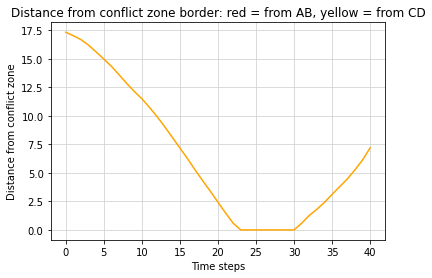

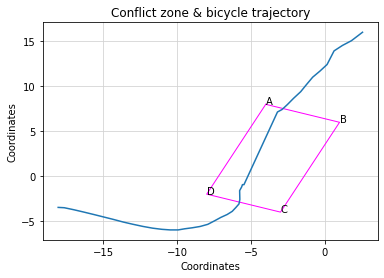

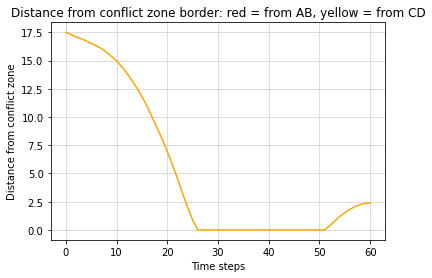

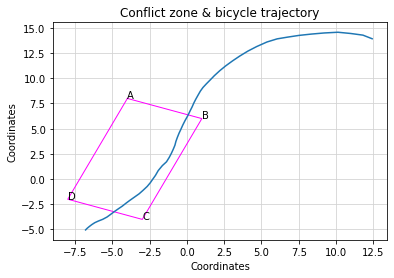

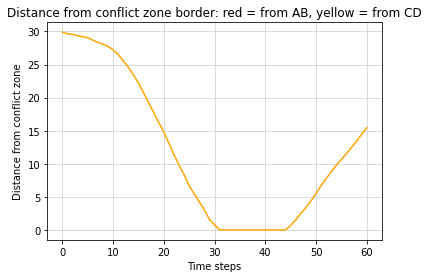

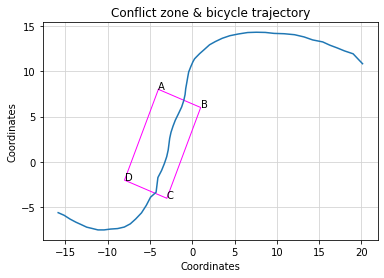

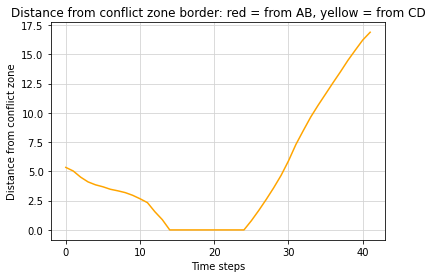

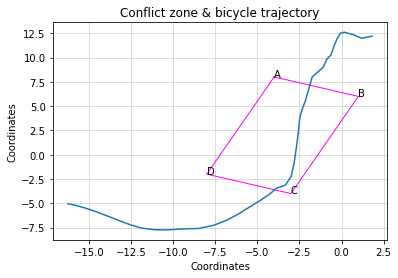

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [199]:
cars, bicycles = getBicyclesAndCarFromAllInteractions(restructured_data)
distances = getBicycleDistanceFromConflictZone(bicycles)

#print(distances[0:5])

## Interaction Zone

##### Explenation of how MN was defined:
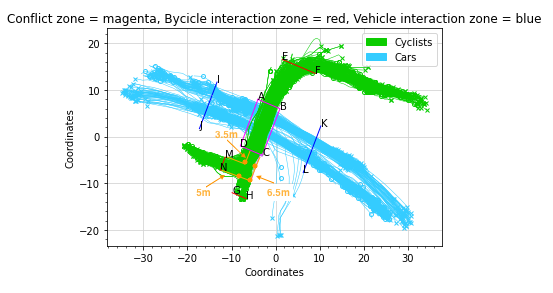

In [105]:
def finPointOnTheSameLineXMetersAway(pointA, pointB, metersAway):
    #A, B, C, D = helper_functions.getConflictZoneCoordinates()
    #print(A, B, C, D, centerOfAB)

    
    # Let's try to find a point along the line AD using vectors
    # https://math.stackexchange.com/questions/175896/finding-a-point-along-a-line-a-certain-distance-away-from-another-point
    
    # v = (X1, y1) - (x0 - y0)
    v = np.array(pointA) - np.array(pointB)
    
    # Normalize this to 𝐮=(𝐯 / ||𝐯||)
    # 𝐯=(𝑣1,𝑣2) ||𝐯||= math.sqrt(𝑣1**2 + 𝑣2**2)
    v1 = v[0]
    v2 = v[1]
    
    _v_ = math.sqrt(v1**2 + v2**2)
    
    u = v/_v_
    
    # The point along your line at a distance 𝑑 from (𝑥0,𝑦0) is then (𝑥0,𝑦0)+𝑑𝐮
    d = metersAway
    P = np.array(pointA) + d*u
    
    #print('P ', P)
    return P

def defineBycicleInteractionZoneCoordinates():
    A, B, C, D = helper_functions.getConflictZoneCoordinates()
    #print(A, B, C, D)
    
    # Let's start with defining the North interaction zone
    # Define dots 10 meters from A, D 
    E_1 = finPointOnTheSameLineXMetersAway(A, D, INTERACTION_ZONE_1_LENGTH)
    F_1 = finPointOnTheSameLineXMetersAway(B, C, INTERACTION_ZONE_1_LENGTH)
    
    # Manually djust the IZ border to be approximately as wide as trajectories
    # (because we will use the center of it to calculate the distance from IZ)
    E = finPointOnTheSameLineXMetersAway(E_1, F_1, -2)
    F = finPointOnTheSameLineXMetersAway(E_1, F_1, -10)
    
    G_1 = finPointOnTheSameLineXMetersAway(D, A, INTERACTION_ZONE_1_LENGTH)
    H = finPointOnTheSameLineXMetersAway(C, B, INTERACTION_ZONE_1_LENGTH)
    
    G = finPointOnTheSameLineXMetersAway(G_1, H, -2)
    
    # Define also the leftmost IZ border in the soth of CZ
    # MN
    
    # Let's use the center of AB and CD for that
    AB_center = getCenterOfAB()
    CD_center = getCenterOfCD()
    
    
    # 5 meters from CZ - in the middle of trajectories so exactly 5m from the CD_center
    #M_1 = finPointOnTheSameLineXMetersAway(CD_center, AB_center, 5)
    #N_1 = finPointOnTheSameLineXMetersAway(C, B, 5)
    
    # Let's move M abit to the north to cober the whole trajectories
    M_1 = finPointOnTheSameLineXMetersAway(CD_center, AB_center, 5-1.5) # 3.5m
    N_1 = finPointOnTheSameLineXMetersAway(C, B, 5-1.5) # 3.5m
    
    M_2 = finPointOnTheSameLineXMetersAway(CD_center, AB_center, 5+1.5) # 6.5m
    N_2 = finPointOnTheSameLineXMetersAway(C, B, 5+1.5) # 6.5m
    
    # Now we find new points that are on the same line as M_1 N_1 
    M = finPointOnTheSameLineXMetersAway(M_1, N_1, 5)
    N = finPointOnTheSameLineXMetersAway(M_2, N_2, 5)
      
    return E, F, G, H, M, N


def defineVehicleInteractionZoneCoordinates():
    A, B, C, D = helper_functions.getConflictZoneCoordinates()
    
    # Let's start with defining the North interaction zone
    # Define dots 10 meters from A, B 
    I = finPointOnTheSameLineXMetersAway(A, B, INTERACTION_ZONE_1_LENGTH)
    L = finPointOnTheSameLineXMetersAway(C, D, INTERACTION_ZONE_1_LENGTH)
    
    K = finPointOnTheSameLineXMetersAway(B, A, INTERACTION_ZONE_1_LENGTH)
    J = finPointOnTheSameLineXMetersAway(D, C, INTERACTION_ZONE_1_LENGTH)
      
    return I, J, K, L


In [106]:
defineBycicleInteractionZoneCoordinates()
defineVehicleInteractionZoneCoordinates()


(array([-13.28476691,  11.71390676]),
 array([-17.28476691,   1.71390676]),
 array([10.28476691,  2.28609324]),
 array([ 6.28476691, -7.71390676]))

In [107]:
def drawBycicleInteractionZone():
    E, F, G, H, M, N = defineBycicleInteractionZoneCoordinates()
    plt.plot([E[0], F[0]], [E[1], F[1]], color='red', linewidth=1)
    plt.text(E[0], E[1], 'E')
    plt.text(F[0], F[1], 'F')
    
    plt.plot([G[0], H[0]], [G[1], H[1]], color='red', linewidth=1)
    plt.text(G[0], G[1], 'G')
    plt.text(H[0], H[1], 'H')
    
    plt.plot([M[0], N[0]], [M[1], N[1]], color='red', linewidth=1)
    plt.text(M[0], M[1], 'M')
    plt.text(N[0], N[1], 'N')
    
def drawVehicleInteractionZone():
    I, J, K, L = defineVehicleInteractionZoneCoordinates()
    plt.plot([I[0], J[0]], [I[1], J[1]], color='blue', linewidth=1)
    plt.text(I[0], I[1], 'I')
    plt.text(J[0], J[1], 'J')
    plt.plot([K[0], L[0]], [K[1], L[1]], color='blue', linewidth=1)
    plt.text(K[0], K[1], 'K')
    plt.text(L[0], L[1], 'L')
    
def drawInteractionAndConflictZones():
    plt.grid(b=True, color='#D3D3D3') # which='minor'
    plt.minorticks_on()
    plt.title('Conflict zone = magenta, Bycicle interaction zone = red, Vehicle interaction zone = blue')
    plt.xlabel('Coordinates')
    plt.ylabel('Coordinates')
    drawConflictZone()
    drawBycicleInteractionZone()
    drawVehicleInteractionZone()

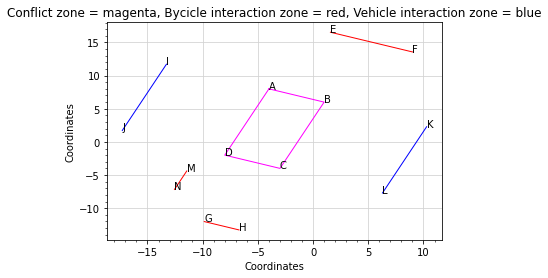

In [108]:
plt.figure()
drawInteractionAndConflictZones()
plt.show()


In [109]:
# Set threshold of speed less than speed_treshold km/h 
def didAgentsSpeedLower(speedOverTime, speed_treshold = 5):
    for index, speed in enumerate(speedOverTime):
        if (index != 0):
            if speed <= speed_treshold :
                return True, index # returns also at what moment the speed dropped
    return False, None


def plotTrajectories(instances, showSpeedChange=False, speed_treshold=10):
    # Create a figure
    plt.figure()
    plt.title('Trajectories')
    
    
    green = '#00cc00'
    blue = '#33ccff'
    red = '#FF0000'

    # For each instance
    for instance in instances:
        #print(key)
        #instance = instances[key] 

        id, t, ts, x, y, v, type, timeDiff, distance_m = getFeatures(instance)

        # Bicycle
        if (type == 1):
            plt.plot(x, y, color=green, linewidth=0.5, label='Cyclist {}'.format(id))
            # Start of the trajectory is represented by o
            plt.plot(x[1], y[1], color=green, marker='o', markersize=4,
                     label='Cyclist {}'.format(id), fillstyle='none')
            # End of the trajectory is represented by x
            plt.plot(x[-1], y[-1], color=green, marker='x', markersize=4,
                     label='Cyclist {}'.format(id), fillstyle='none')
            
            if (showSpeedChange == True):
                didSpeedLower, atTimeStep = didAgentsSpeedLower(v, speed_treshold)
        
                if didSpeedLower == True:
                    print("Cyclist's speed lowered to", speed_treshold, "or less km/h! (id: ", id, ')')
                    plt.plot(x[atTimeStep], y[atTimeStep], color=red, marker='v', markersize=4,
                     label='Cyclist {}'.format(id), fillstyle='none')
                    
                
                    
                

        # Car
        elif (type == 2):
            plt.plot(x, y, color=blue, linewidth=0.5, label='Car {}'.format(id))
            plt.plot(x[1], y[1], color=blue, marker='o', markersize=4,
                     label='Car {}'.format(id), fillstyle='none')
            plt.plot(x[-1], y[-1], color=blue, marker='x', markersize=4,
                     label='Car {}'.format(id), fillstyle='none')
            
            if (showSpeedChange == True):
                didSpeedLower, atTimeStep = didAgentsSpeedLower(v, speed_treshold)

                if didSpeedLower == True:
                    print("Car's speed lowered to", speed_treshold, "or less km/h! (id: ", id, ')')
                    
                    plt.plot(x[atTimeStep], y[atTimeStep], color=red, marker='v', markersize=4,
                     label='Car {}'.format(id), fillstyle='none')

        else:
            print('-- Unknown agent type! --')

    # Create a plot with legend
    green_patch = mpatches.Patch(color=green, label='Cyclists')
    blue_patch = mpatches.Patch(color=blue, label='Cars')
    plt.legend(handles=[green_patch, blue_patch])
    
    drawInteractionAndConflictZones()

    plt.show()


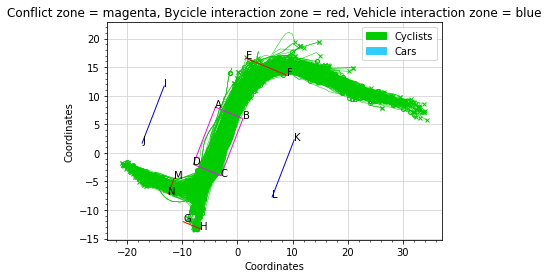

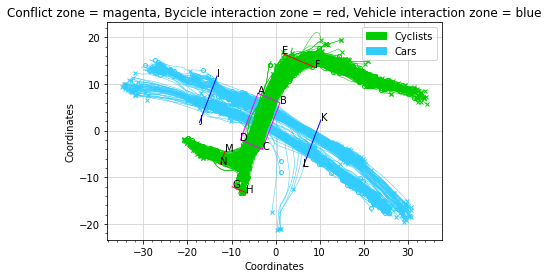

In [110]:
cars, bicycles = getBicyclesAndCarFromAllInteractions(restructured_data)

plotTrajectories(bicycles)
plotTrajectories(np.concatenate((cars, bicycles)))

# Feature - arrival time difference
 It is assumed that there is a conflict if a vehicle and a bicycle are simultaneously in their respective IZ.
 
 The arrival time difference (ATD) between the vehicle and the bicycle at the boundary of each interaction zone is the key variable in establishing a conflict event
 
 * Nonconflict: ATD > 5.5 s
 * Conflict: ATD ≤ 5.5 s.

In [111]:
# ----- Interaction zone border center coordinates -----

# --------- Bycicle IZ center points ---------
def getCenterOfEF():
    E, F, G, H, M, N = defineBycicleInteractionZoneCoordinates()
    
    X_coordinate_of_EF_center = (E[0] + F[0])/2
    Y_coordinate_of_EF_center = (E[1] + F[1])/2
    
    center = [X_coordinate_of_EF_center, Y_coordinate_of_EF_center]
    return center

def getCenterOfGH():
    E, F, G, H, M, N = defineBycicleInteractionZoneCoordinates()
    
    X_coordinate_of_GH_center = (G[0] + H[0])/2
    Y_coordinate_of_GH_center = (G[1] + H[1])/2
    
    center = [X_coordinate_of_GH_center, Y_coordinate_of_GH_center]
    return center

def getCenterOfMN():
    E, F, G, H, M, N = defineBycicleInteractionZoneCoordinates()
    
    X_coordinate_of_MN_center = (M[0] + N[0])/2
    Y_coordinate_of_MN_center = (M[1] + M[1])/2
    
    center = [X_coordinate_of_MN_center, Y_coordinate_of_MN_center]
    return center

# --------- Vehicle IZ center points ---------

def getCenterOfIJ():
    I, J, K, L = defineVehicleInteractionZoneCoordinates()
    
    X_coordinate_of_IJ_center = (I[0] + J[0])/2
    Y_coordinate_of_IJ_center = (I[1] + J[1])/2
    
    center = [X_coordinate_of_IJ_center, Y_coordinate_of_IJ_center]
    return center

def getCenterOfKL():
    I, J, K, L = defineVehicleInteractionZoneCoordinates()
    
    X_coordinate_of_KL_center = (K[0] + L[0])/2
    Y_coordinate_of_KL_center = (K[1] + L[1])/2
    
    center = [X_coordinate_of_KL_center, Y_coordinate_of_KL_center]
    return center


In [127]:
# --------- Distances from Bycicle IZ border center points ---------

def getDistanceFromEF(x_coordinate, y_coordinate):
    
    XY = np.array([x_coordinate, y_coordinate])
    EF_center = np.array(getCenterOfEF())
    
    dist = distance.euclidean(EF_center, XY)
        
    return dist

def getDistanceFromGH(x_coordinate, y_coordinate):
    
    XY = np.array([x_coordinate, y_coordinate])
    GH_center = np.array(getCenterOfGH())
    
    dist = distance.euclidean(GH_center, XY)
        
    return dist

def getDistanceFromMN(x_coordinate, y_coordinate):
    
    XY = np.array([x_coordinate, y_coordinate])
    MN_center = np.array(getCenterOfMN())
    
    dist = distance.euclidean(MN_center, XY)
        
    return dist

# --------- Distances from Vehicle IZ border center points ---------

def getDistanceFromIJ(x_coordinate, y_coordinate):
    
    XY = np.array([x_coordinate, y_coordinate])
    IJ_center = np.array(getCenterOfIJ())
    
    dist = distance.euclidean(IJ_center, XY)
        
    return dist

def getDistanceFromKL(x_coordinate, y_coordinate):

    XY = np.array([x_coordinate, y_coordinate])
    KL_center = np.array(getCenterOfKL())
    
    dist = distance.euclidean(KL_center, XY)
        
    return dist


In [128]:
# --- Distance and index calculations ----

def getDistanceFromPointPerEachTimestamp(distanceFromPointFunction, instance_x_coordinates, instance_y_coordinates): 
    agents_distances_from_point = []
    
    for i, x in enumerate(instance_x_coordinates):
        y = instance_y_coordinates[i]
        
        dist = distanceFromPointFunction(x, y)
        agents_distances_from_point.append(dist)
        
    return agents_distances_from_point


def findIndexWhenAgentWasClosestToInterActionZone(distances_from_IZ):
    smallestDistFromIZ = min(distances_from_IZ)
    
    index = distances_from_IZ.index(smallestDistFromIZ)
    #print(index)
    
    return index


### Vehicles

In [129]:
# Step 1
# Find index of timestamp when vehicle enters IZ
# Find index of timestamp when bycicle enters IZ

# Step 2
# Compare the timestamps


def findIndexWhenVehcileEntersInteractionZone(instance):
    id, t, ts, x, y, v, type, timeDiff, distance_m = getFeatures(instance)
    

    # Decide from where is the agent coming and based on this which interaction zone will he reach first       
    distancesFromIJ = getDistanceFromPointPerEachTimestamp(getDistanceFromIJ, x, y)
    distancesFromKL = getDistanceFromPointPerEachTimestamp(getDistanceFromKL, x, y)

    # If first the agent was closer to the IJ then coming from West
    isComingFromWest = findIndexWhenAgentWasClosestToInterActionZone(distancesFromIJ) < findIndexWhenAgentWasClosestToInterActionZone(distancesFromKL)
    

    if isComingFromWest == True: 
        index = findIndexWhenAgentWasClosestToInterActionZone(distancesFromIJ)
        
    else:
        index = findIndexWhenAgentWasClosestToInterActionZone(distancesFromKL)
    
    return index



### Bycicles

In [134]:
def findIndexWhenBycicleEntersInteractionZone(instance):
    id, t, ts, x, y, v, type, timeDiff, distance_m = getFeatures(instance)
    

    # Decide from where is the agent coming and based on this which interaction zone will he reach first
    distancesFromEF = getDistanceFromPointPerEachTimestamp(getDistanceFromEF, x, y)
    distancesFromGH = getDistanceFromPointPerEachTimestamp(getDistanceFromGH, x, y)
    distancesFromMN = getDistanceFromPointPerEachTimestamp(getDistanceFromMN, x, y)
    
    # AS GH and MN are both in south let's compare them together
    indexWhenAgentWasClosestToSouthIZ = min([findIndexWhenAgentWasClosestToInterActionZone(distancesFromGH), findIndexWhenAgentWasClosestToInterActionZone(distancesFromMN)])

    # If first the agent was closer to the EF then coming from North
    isComingFromNorth = findIndexWhenAgentWasClosestToInterActionZone(distancesFromEF) < indexWhenAgentWasClosestToSouthIZ
    

    if isComingFromNorth == True: 
        index = findIndexWhenAgentWasClosestToInterActionZone(distancesFromEF)
        
    else:
        index = indexWhenAgentWasClosestToSouthIZ
    
    return index


### Plot vehicles and Bycicles

In [291]:
def plotTrajectoryWithClosestPointToIZ(x, y, indexClosestToIZ):
    
    # Plot trajectory
    plt.plot(x, y)
    # Start of the trajectory is represented by o
    plt.plot(x[0], y[0], color='purple', marker='o', markersize=4,
             label='Cyclist {}'.format(id), fillstyle='none')

    # Plot closest point to interaction zone
    plt.plot(x[indexClosestToIZ], y[indexClosestToIZ], '+g')
    plt.plot(x[indexClosestToIZ], y[indexClosestToIZ], 'o', color='orange')

def plotInteractionWithClosestPointToIZ(arrayOfAgentsInInteraction):
    
     # Plot trajectory and conflict zone
    plt.figure()
    plt.grid(b=True, color='#D3D3D3')
    plt.title('Conflict zone & bicycle trajectory')
    plt.xlabel('Coordinates')
    plt.ylabel('Coordinates')
    drawInteractionAndConflictZones()
    
    # Plot legend
    orange_dot = mpatches.Patch(color='orange', label='Closest point to IZ')
    magenta_dot = mpatches.Patch(color='purple', label='Start of the trajectory')
    plt.legend(handles=[orange_dot, magenta_dot])
    
    for agentData in arrayOfAgentsInInteraction:
        plotTrajectoryWithClosestPointToIZ(agentData['xCoordinates'], agentData['yCoordinates'], agentData['indexClosestToIZ'])
    
    plt.show()

def findIndexWhenAgentEntersInteractionZone(agentType, agent):
  
    # Bycicle
    if agentType == 1:
        indexClosestToIZ = findIndexWhenBycicleEntersInteractionZone(agent)

    # Car
    if agentType == 2:
        indexClosestToIZ = findIndexWhenVehcileEntersInteractionZone(agent)
            
    return indexClosestToIZ
           

In [342]:
def getInteractionsWithTimeOfEnteringIZ(interactions, shouldPlot=False, amountToPlot=1000):
    
    for index, interaction_id in enumerate(interactions):
        interaction = interactions[interaction_id]
        
        arrayOfAgentsInInteraction = []
        
        for instance in interaction:
            id, t, ts, x, y, v, type, timeDiff, distance_m = getFeatures(instance)
            
            indexOfEnteringIZ = findIndexWhenAgentEntersInteractionZone(type, instance)
            timeOfEnteringInteractionZone = ts[indexOfEnteringIZ]
            speedAtTheBorderOfInteractionZone = v[indexOfEnteringIZ]
            
            # Bycicle
            if type == 1: 
                distancesFromConflictZone = calculateDistancesFromConflictZonePerEachTimestampForBycicle(instance)
            
            # Car
            if type == 2:
                distancesFromConflictZone = calculateDistancesFromConflictZonePerEachTimestampForVehicle(instance)
                
            instance['timeOfEnteringInteractionZone'] = timeOfEnteringInteractionZone
            instance['speedAtTheBorderOfInteractionZone'] = speedAtTheBorderOfInteractionZone
            instance['distanceFromConflictZone'] = distancesFromConflictZone
                
            
            # For plotting
            agentsInInteraction = {}
            agentsInInteraction['xCoordinates'] = x
            agentsInInteraction['yCoordinates'] = y
            agentsInInteraction['indexClosestToIZ'] = indexOfEnteringIZ
            
            arrayOfAgentsInInteraction.append(agentsInInteraction)
        
        if shouldPlot == True and index < amountToPlot:
            plotInteractionWithClosestPointToIZ(arrayOfAgentsInInteraction)
            
    return interactions

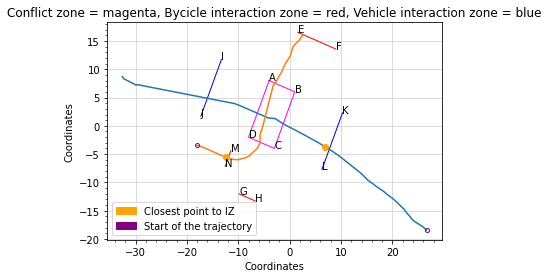

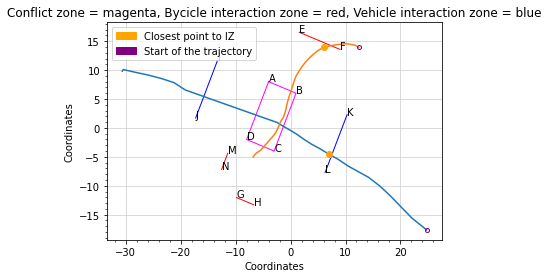

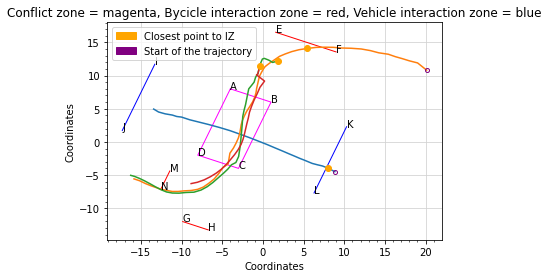

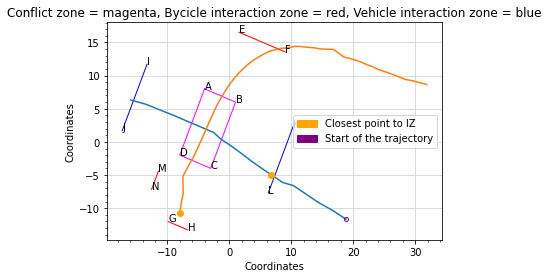

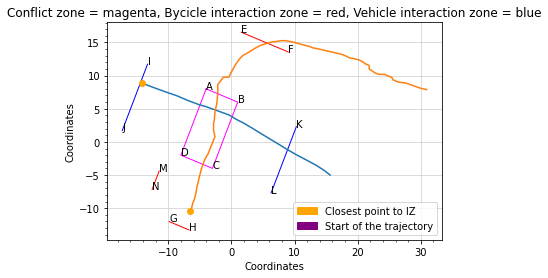

 ---- indexOfEnteringConflictZone, indexOfExitingConflictZone --- 8 8


{0: [{'InteractionID': 0,
   'CarID': 296,
   'ID': 296,
   'DateTime': [736942.6628986342,
    736942.6629015394,
    736942.6629043982,
    736942.6629072222,
    736942.6629101273,
    736942.6629129514,
    736942.6629158565,
    736942.6629186689,
    736942.6629215741,
    736942.6629244097,
    736942.6629272685,
    736942.6629301967,
    736942.6629329977,
    736942.662935868,
    736942.6629387268,
    736942.6629415972,
    736942.6629444908,
    736942.6629473264,
    736942.6629501968,
    736942.6629530556,
    736942.6629559259,
    736942.6629587847,
    736942.6629616551,
    736942.6629645717,
    736942.6629673959,
    736942.6630084838,
    736942.6630113426,
    736942.6630142014,
    736942.6630170601,
    736942.6630199306,
    736942.6630227894,
    736942.6630256597,
    736942.6630285301,
    736942.6630314004,
    736942.6630342477,
    736942.663037118,
    736942.663038831,
    736942.6630487615,
    736942.6630516088,
    736942.6630909606,
    736942.663

In [343]:
getInteractionsWithTimeOfEnteringIZ(restructured_data, shouldPlot=True, amountToPlot=5)

## Sort out interactions where some agent's trajectory starts too close to the conflict zone (starts from already inside the interaction zone)

##### If some agent's trajectory in the interaction starts from already being inside the Interaction Zone = is less than 10m then discard the interaction

In [344]:
def determineIfTrajectoryStartsFurtherThan10MetersFromCZ(distancesFromConflictZone):
    
    # We know that conflict zone starts when distance from it is 0
    indexOfConflictZoneStart = np.where(distancesFromConflictZone == 0)[0][0]
    #print('indexOfConflictZoneStart  .... ', indexOfConflictZoneStart)
    
    largestDistFromCZ = max(distancesFromConflictZone[0:indexOfConflictZoneStart])
    #print(' --- largestDistFromCZ ---', largestDistFromCZ)
    
    if largestDistFromCZ >= INTERACTION_ZONE_1_LENGTH:
        return True
    else: 
        return False
    

In [345]:
def sortOutInteractionsWhichStartLessThan10MetersFromCZ(interactions, shouldPlot=False):
    print('###### Initial amount of interactions: ', len(interactions), '######')
    validInteractionsStartingOutsideTheIZ = {}
    
    # Make sure there is distance more than 10m inside the distances before the CZ
    
    
    for index, interaction_id in enumerate(interactions):
        areCarTrajectoriesValid = []
        areBycicleTrajectoriesValid = []

        interaction = interactions[interaction_id]
        interactionWithTrajectoriesThatStartFromOutsideTheIZ = [] 
        
        for instance in interaction:
            id, t, ts, x, y, v, type, timeDiff, distance_m = getFeatures(instance)
            
            if type == 1: 
                # print('bycicle:  ')
                distancesFromConflictZone = calculateDistancesFromConflictZonePerEachTimestampForBycicle(instance)
            
            if type == 2:
                # print('car:  ')
                distancesFromConflictZone = calculateDistancesFromConflictZonePerEachTimestampForVehicle(instance)
            
            doesTrajectoryStartFurtherThan10MetersFromCZ = determineIfTrajectoryStartsFurtherThan10MetersFromCZ(distancesFromConflictZone)
            
            # Let's add instance to interaction if the trajectory really stars further than 10m from CZ
            if doesTrajectoryStartFurtherThan10MetersFromCZ == True:
                interactionWithTrajectoriesThatStartFromOutsideTheIZ.append(instance)
                
            # Bycicle
            if type == 1: 
                areBycicleTrajectoriesValid.append(doesTrajectoryStartFurtherThan10MetersFromCZ)

            # Car
            if type == 2:
                areCarTrajectoriesValid.append(doesTrajectoryStartFurtherThan10MetersFromCZ)


                
        isInteractionValid = all(areCarTrajectoriesValid) and any(areBycicleTrajectoriesValid)
        
        if isInteractionValid == True:
            validInteractionsStartingOutsideTheIZ[interaction_id] = interactionWithTrajectoriesThatStartFromOutsideTheIZ
        
        # For testing:
        #if index < 4 and isInteractionValid == True:
            #print(interaction)

        if isInteractionValid == True and shouldPlot == True:
            plotTrajectories(interactionWithTrajectoriesThatStartFromOutsideTheIZ)
            
    print('###### Final amount of interactions: ', len(validInteractionsStartingOutsideTheIZ), '######')
    return validInteractionsStartingOutsideTheIZ
        
            

###### Initial amount of interactions:  520 ######


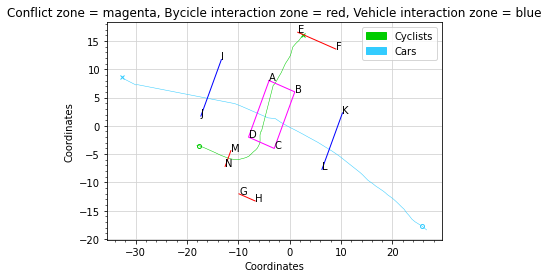

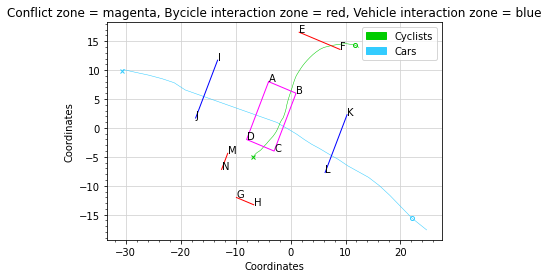

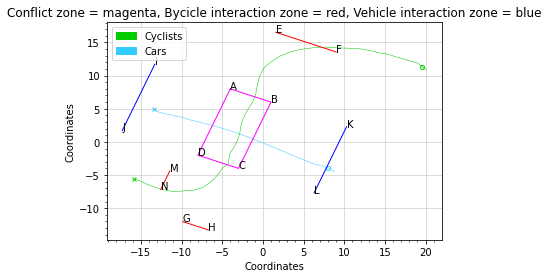

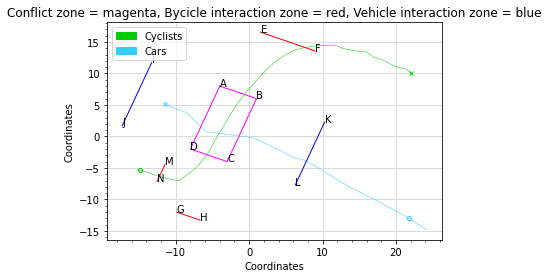

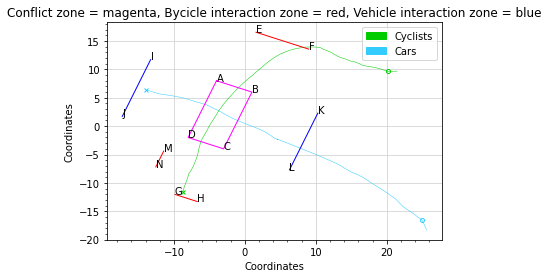

...

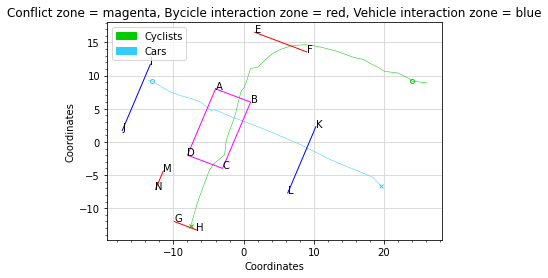

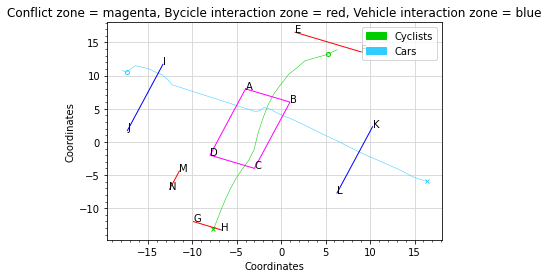

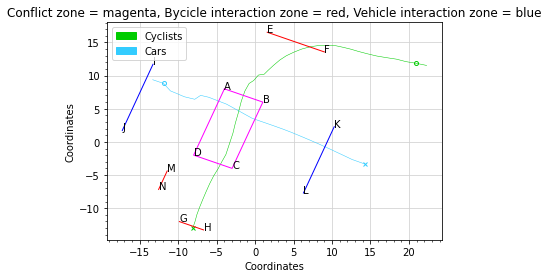

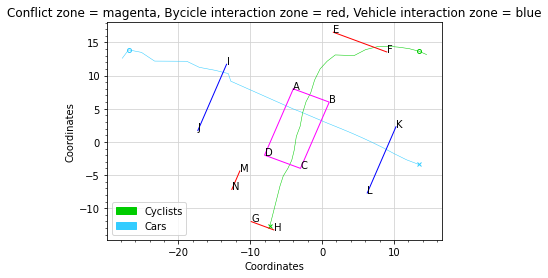

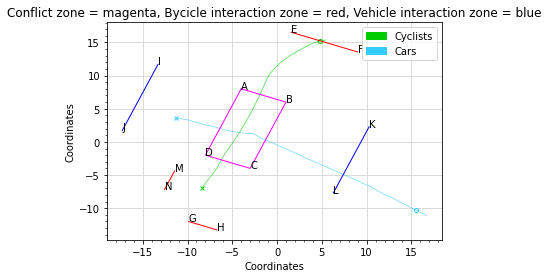

 ---- indexOfEnteringConflictZone, indexOfExitingConflictZone --- 8 8


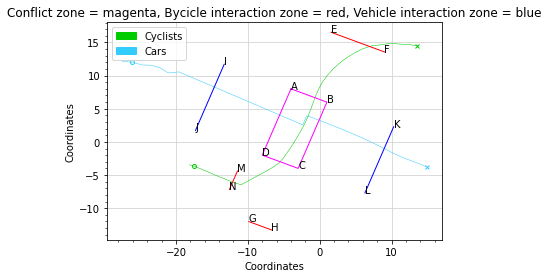

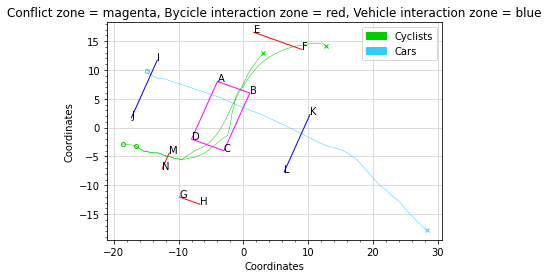

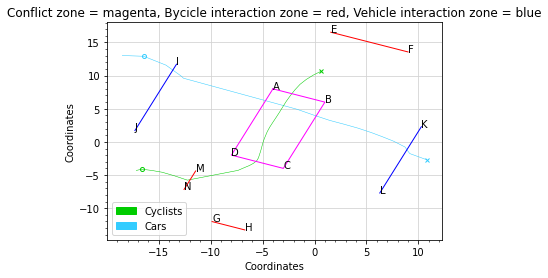

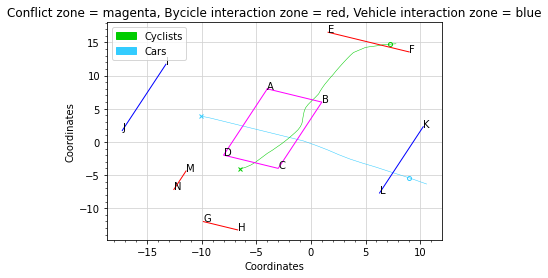

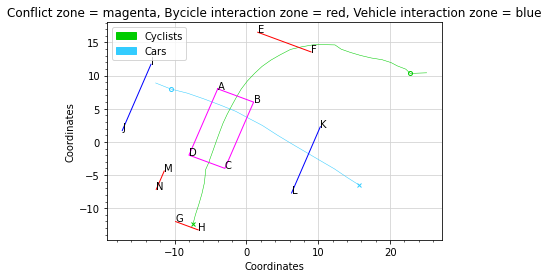

...

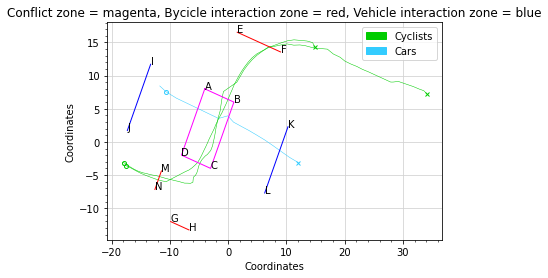

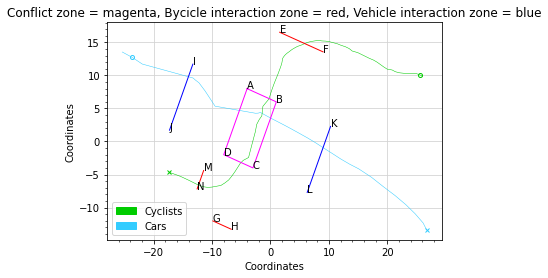

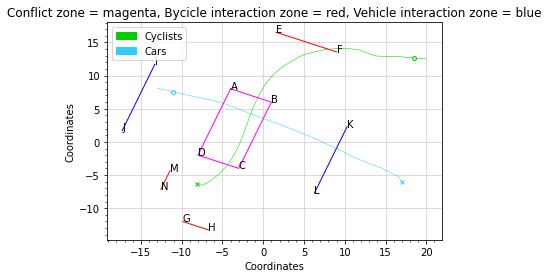

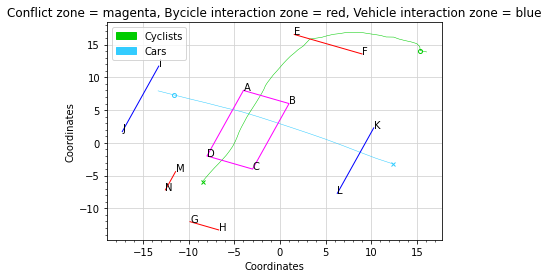

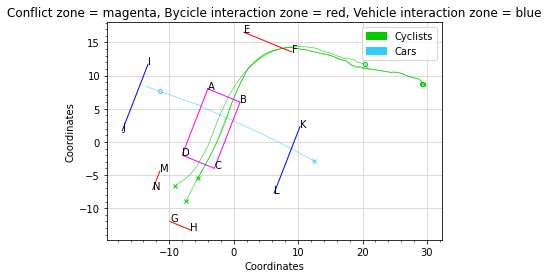

###### Final amount of interactions:  167 ######


In [346]:
validInteractionsStartingOutsideTheIZ = sortOutInteractionsWhichStartLessThan10MetersFromCZ(restructured_data, shouldPlot=True)


## Calculate arrival time difference for each interaction 
#### Arrival time difference between the car and the first bycicle who reached the IZ.

As interaction is an array of instances, we write the ATD into each instance inside the interaction.

###### Initial amount of interactions:  520 ######
 ---- indexOfEnteringConflictZone, indexOfExitingConflictZone --- 8 8
###### Final amount of interactions:  167 ######


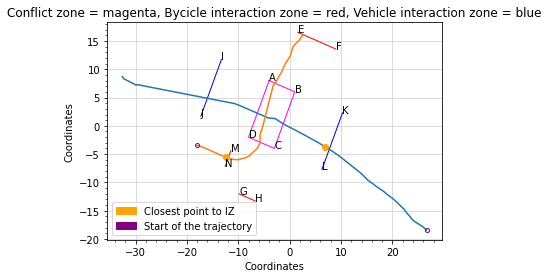

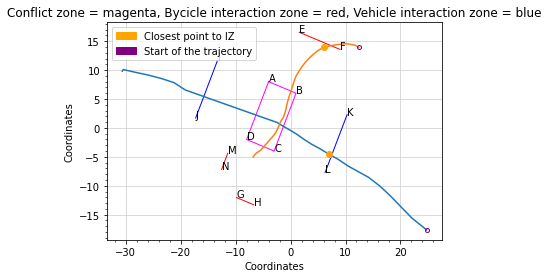

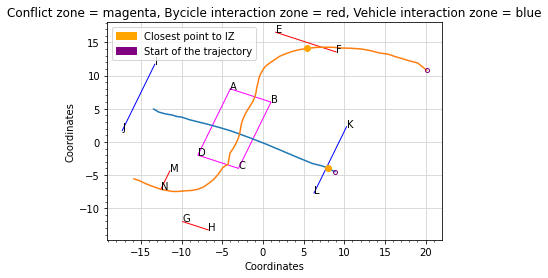

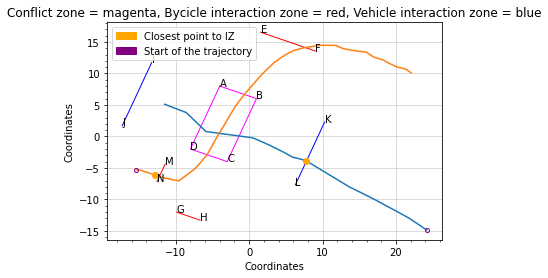

 ---- indexOfEnteringConflictZone, indexOfExitingConflictZone --- 8 8
[{'InteractionID': 0, 'CarID': 296, 'ID': 296, 'DateTime': [736942.6628986342, 736942.6629015394, 736942.6629043982, 736942.6629072222, 736942.6629101273, 736942.6629129514, 736942.6629158565, 736942.6629186689, 736942.6629215741, 736942.6629244097, 736942.6629272685, 736942.6629301967, 736942.6629329977, 736942.662935868, 736942.6629387268, 736942.6629415972, 736942.6629444908, 736942.6629473264, 736942.6629501968, 736942.6629530556, 736942.6629559259, 736942.6629587847, 736942.6629616551, 736942.6629645717, 736942.6629673959, 736942.6630084838, 736942.6630113426, 736942.6630142014, 736942.6630170601, 736942.6630199306, 736942.6630227894, 736942.6630256597, 736942.6630285301, 736942.6630314004, 736942.6630342477, 736942.663037118, 736942.663038831, 736942.6630487615, 736942.6630516088, 736942.6630909606, 736942.6630938194, 736942.6630966899, 736942.6630972569], 'Sec': [1504540474.442, 1504540474.693, 1504540474.94, 

In [347]:
validInteractions = sortOutInteractionsWhichStartLessThan10MetersFromCZ(restructured_data, shouldPlot=False)
interactionsWithTimeOfEnteringIZ = getInteractionsWithTimeOfEnteringIZ(validInteractions, shouldPlot=True, amountToPlot=4)

print(interactionsWithTimeOfEnteringIZ[0])


In [348]:
def findArrivalTimeDifferencePerInteraction(interaction):
    timeStampsOfByciclesEnteringIZ = []
    timeStampOfCarEnteringIZ = 0
    
    for instance in interaction:
            
        # If bycicle, then choose the one which reached the IZ first
        if instance['AgentType'] == 1:
            timeStampsOfByciclesEnteringIZ.append(instance['timeOfEnteringInteractionZone'])

        # If car then take the timeOfEnteringIZ (as every interaction has only 1 car)
        if instance['AgentType'] == 2: 
            timeStampOfCarEnteringIZ = instance['timeOfEnteringInteractionZone']

    # Negative ATD means that car reached the IZ first?
    # We can take a look how this affects the yielding decision?
    ATD = timeStampOfCarEnteringIZ - min(timeStampsOfByciclesEnteringIZ)

    return ATD
    
def writeArrivalTimeDifferenceIntoEachInstanceInInteraction(interaction, ATD):
    
    for instance in interaction:
        instance['arrivalTimeDifference'] = ATD

    return interaction

def findAndUpdateInteractionsArrivalTimeDifference(interactionsWithTimeOfEnteringIZ):
    interactionsWithATD = {}
    
    for index, interaction_id in enumerate(interactionsWithTimeOfEnteringIZ):
        interaction = interactionsWithTimeOfEnteringIZ[interaction_id]

        ATD = findArrivalTimeDifferencePerInteraction(interaction)
        interactionWithATD = writeArrivalTimeDifferenceIntoEachInstanceInInteraction(interaction, ATD)

        interactionsWithATD[interaction_id] = interactionWithATD
        
    return interactionsWithATD

    

In [349]:
interactionsWithATD = findAndUpdateInteractionsArrivalTimeDifference(interactionsWithTimeOfEnteringIZ)

print(interactionsWithATD[0])

[{'InteractionID': 0, 'CarID': 296, 'ID': 296, 'DateTime': [736942.6628986342, 736942.6629015394, 736942.6629043982, 736942.6629072222, 736942.6629101273, 736942.6629129514, 736942.6629158565, 736942.6629186689, 736942.6629215741, 736942.6629244097, 736942.6629272685, 736942.6629301967, 736942.6629329977, 736942.662935868, 736942.6629387268, 736942.6629415972, 736942.6629444908, 736942.6629473264, 736942.6629501968, 736942.6629530556, 736942.6629559259, 736942.6629587847, 736942.6629616551, 736942.6629645717, 736942.6629673959, 736942.6630084838, 736942.6630113426, 736942.6630142014, 736942.6630170601, 736942.6630199306, 736942.6630227894, 736942.6630256597, 736942.6630285301, 736942.6630314004, 736942.6630342477, 736942.663037118, 736942.663038831, 736942.6630487615, 736942.6630516088, 736942.6630909606, 736942.6630938194, 736942.6630966899, 736942.6630972569], 'Sec': [1504540474.442, 1504540474.693, 1504540474.94, 1504540475.184, 1504540475.435, 1504540475.679, 1504540475.93, 1504540

## Write features to CSV file

* Write to CSV file
    * Car speed at the border of IZ
    * ATD at the border of IZ
    * Distance from Conflict Zone per each timestamp?
* Create videos of new valid interactions together with IZ and CZ borders
* Manually label the interactions
* See if there are any relations, interesting findings

Check: 
* For features do I need bicycle distance from the CZ at every timestep or at the moment when car has entered the inetaction zone?
* Do I need the bicycle's speed at the moment when car has entered the inetaction zone?
* Do I need the car's speed at the moment when bicycle has entered the inetaction zone?
